In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.preprocessing import FunctionTransformer

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, plot_ccf

In [2]:
data_folder = "data/raw/Hillerod_2021-2024.csv"
df0 = pd.read_csv(data_folder)
df0["DATETIME"] = pd.to_datetime(df0["DATETIME"]).dt.tz_localize(tz = 'Europe/Copenhagen', ambiguous=True)
df0.set_index("DATETIME", inplace=True)

rain = pd.read_csv("data/raw/NutrientRain.csv")
rain["DATETIME"] = pd.to_datetime(rain["DATETIME"]).dt.tz_convert(tz = 'Europe/Copenhagen')
rain.set_index("DATETIME", inplace=True)

df0 = pd.merge(df0, rain, left_index=True, right_index=True, how="left")

df0.sort_index(ascending=True, inplace=True)

In [3]:
start_date = df0.index.min()
end_date = df0.index.max()

time_range = pd.date_range(start_date, end_date, freq="min")

empty_df = pd.DataFrame({"DATETIME":time_range}).set_index("DATETIME")
df0 = pd.merge(empty_df, df0, left_index=True, right_index=True, how="left")

print(len(time_range))
print(df0.shape)

1649880
(1649880, 7)


In [4]:
df0.head()

,TOC,TN,TP,SS,Flow,Bypass,Rain
DATETIME,,,,,,,
2021-01-01 00:00:00+01:00,63.8125,26.884375,2.804375,3.588401,912.0,0.000000,NaN
2021-01-01 00:01:00+01:00,64.3750,26.906250,2.808750,3.594663,940.0,0.000000,NaN
2021-01-01 00:02:00+01:00,64.5000,26.971874,2.817500,3.615731,995.0,0.000000,NaN
2021-01-01 00:03:00+01:00,64.3750,26.884375,2.808750,3.572590,973.0,-0.000061,NaN
2021-01-01 00:04:00+01:00,64.3750,27.037500,2.821875,3.597916,978.0,-0.000061,NaN


In [5]:
pollutants = ["TOC", "TN", "TP", "SS"]
flows = ["Flow", "Bypass"]
Rain = ["Rain"]

In [6]:
negative_threshold = - 0.1
neg_cleaner = lambda x: x if x > 0 else np.nan if x < negative_threshold else 0

for pollutant in pollutants:
    df0[pollutant] = df0[pollutant].apply(neg_cleaner)

df0["Bypass"] = df0["Bypass"].apply(neg_cleaner)

df0.describe()

,TOC,TN,TP,SS,Flow,Bypass,Rain
count,1.610729e+06,1.610728e+06,1.610727e+06,1.649880e+06,1.644084e+06,1.649880e+06,25357.000000
mean,1.163922e+02,3.257294e+01,8.210787e+00,5.292804e-01,7.107620e+02,4.447756e+01,0.084758
std,7.456460e+01,1.900720e+01,1.359493e+01,7.713271e-01,3.166671e+02,1.810672e+02,0.455585
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000
25%,6.781250e+01,2.003750e+01,2.030000e+00,2.170105e-01,4.480000e+02,0.000000e+00,0.000000
50%,1.109375e+02,3.160938e+01,5.070625e+00,3.676801e-01,7.110000e+02,0.000000e+00,0.000000
75%,1.577500e+02,4.420937e+01,8.478750e+00,5.982978e-01,9.420000e+02,0.000000e+00,0.000000
max,1.002000e+03,3.515312e+02,7.014438e+01,4.707549e+01,3.200000e+03,1.390000e+03,15.600000


In [46]:
df = df0.resample("h").mean()

df["hour_of_year"] = (df.index.day_of_year - 1) * max_lag + df.index.hour
df["datetime"] = df.index

bypass_threshold = 0.1
df["regime"] = df["Bypass"] > bypass_threshold
df["bypass_ratio"] = df["Bypass"] / df["Flow"]

melted_index = "datetime"

columns_df = df.columns
melted_df = pd.melt(df, id_vars=[melted_index], value_vars=columns_df)
melted_df["family"] = "Flow"
melted_df.loc[melted_df["variable"].isin(pollutants).to_list(), "family"] = "Pollutant"

In [8]:
fig = px.line(melted_df[melted_df.variable.isin(pollutants + flows)], x=melted_index, y="value", color="variable", facet_row="family", width=1600, height=600)
fig.update_xaxes(title_text=melted_index)
fig.update_yaxes(title_text='Value', matches="x")
fig.show()

In [47]:
# Including harmonic signals
def sin_encoder(period):
        return FunctionTransformer(lambda x: np.sin((2 * np.pi* x)/period))

def cos_encoder(period):

    return FunctionTransformer(lambda x: np.cos((2 * np.pi* x)/period))

df["sine"] = sin_encoder(24).fit_transform(df.index.hour)
df["cosine"] = cos_encoder(24).fit_transform(df.index.hour)

# Including day of week
df["is_weekend"] = df.index.dayofweek.isin([5, 6])

# Taking the logarithm of Pollutants
logcn = lambda x: f"log{x}"
logpollutants = []
for p in pollutants:
    cn = logcn(p)
    df[cn] = np.log(1 + df[p].divide(df[p].max()))
    logpollutants.append(cn)

# Data exploration

In [37]:
is_from_family = lambda x, family: any([variable in x for variable in family])

pollutants_ = [col for col in df.columns if is_from_family(col, pollutants)]
flows_ = [col for col in df.columns if is_from_family(col, flows)]

In [73]:
def plot_autocorr(series, title=""):

    # We first select the longest stretch in our data without NAs
    a = series.values
    m = np.concatenate(( [True], np.isnan(a), [True] ))  # Mask
    ss = np.flatnonzero(m[1:] != m[:-1]).reshape(-1,2)   # Start-stop limits
    start,stop = ss[(ss[:,1] - ss[:,0]).argmax()]

    series = series[start:stop]

    fig, axes = plt.subplots(1, 3, figsize=(17, 3))
    plot_acf(series, ax=axes[0], lags=30)
    plot_pacf(series, ax=axes[1], lags=30)
    series.hist(ax=axes[2], edgecolor="white", grid=False, bins=30)
    axes[0].axvline(x=5, c="red")
    axes[1].axvline(x=5, c="red")
    axes[2].set_title("Disribution")
    axes[0].set_ylim(-0.5, 1)
    axes[1].set_ylim(-0.5, 1)
    fig.suptitle(title)
    plt.tight_layout()
    plt.show()


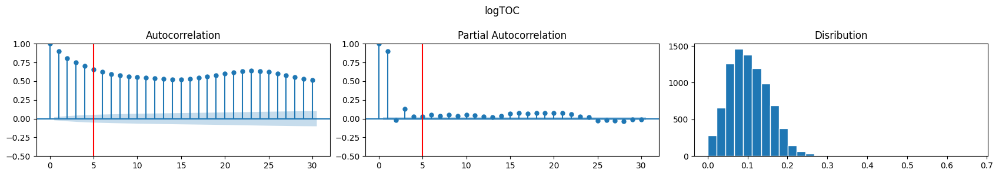

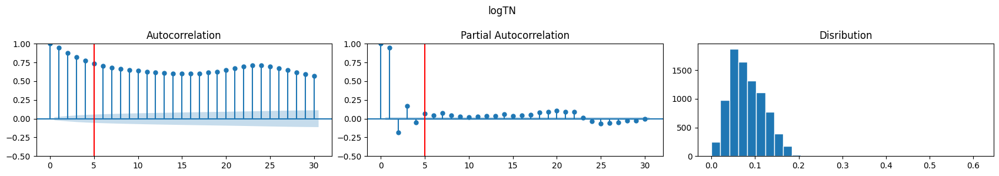

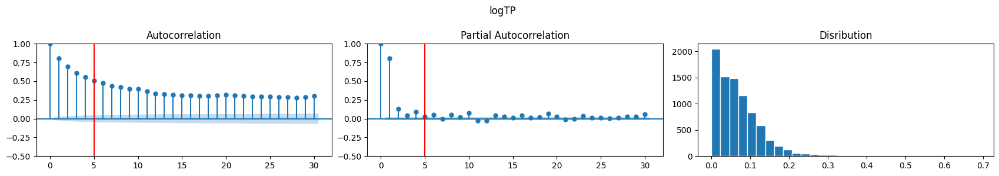

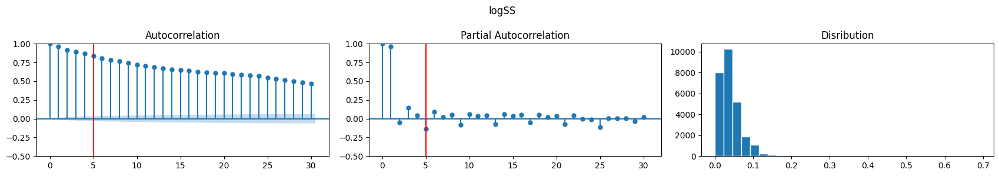

In [75]:
for p in logpollutants:
    plot_autocorr(df[p], title=p)

# Exploring variable dependencies 

In [84]:
np.random.seed(14)

nrows = df.shape[0]
sample_size = 200
ix = np.random.randint(0, nrows-sample_size)
sample_df = df.iloc[ix:ix+sample_size, :]
sample_df.shape

(200, 72)

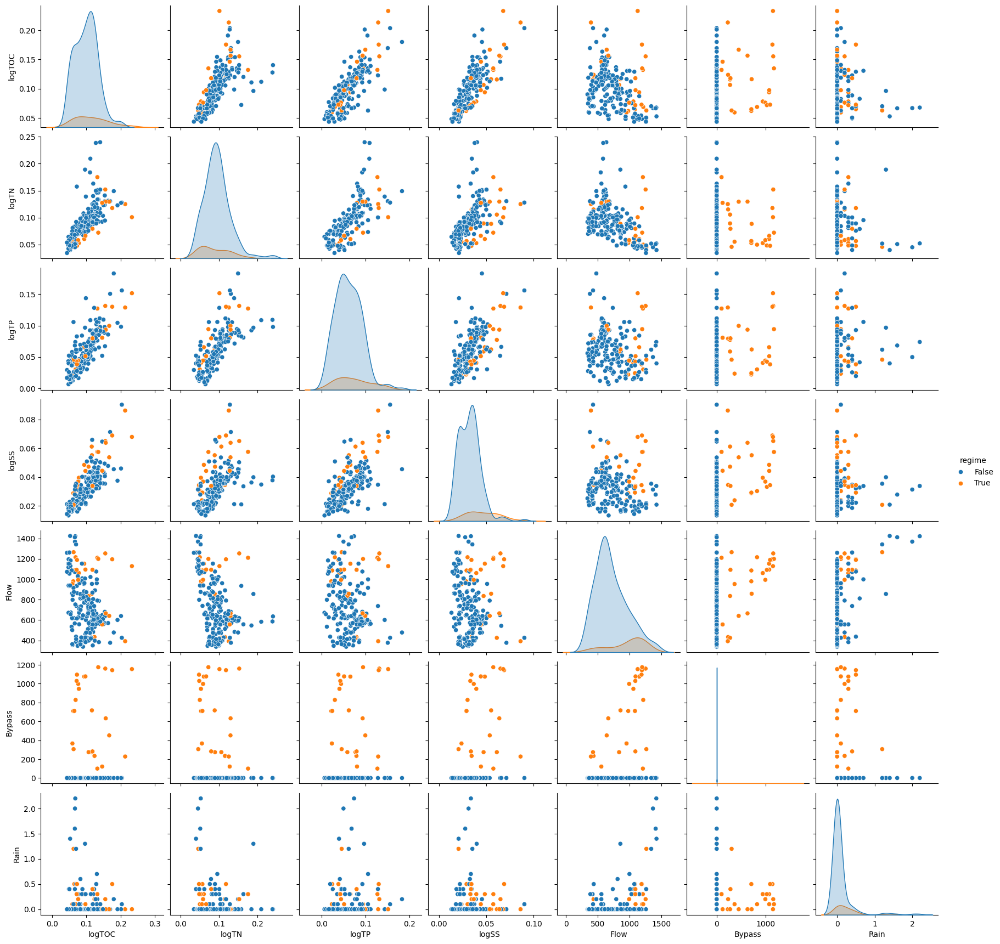

In [96]:
sns.pairplot(sample_df[logpollutants + flows + ["Rain"] + ["regime"]], hue="regime")

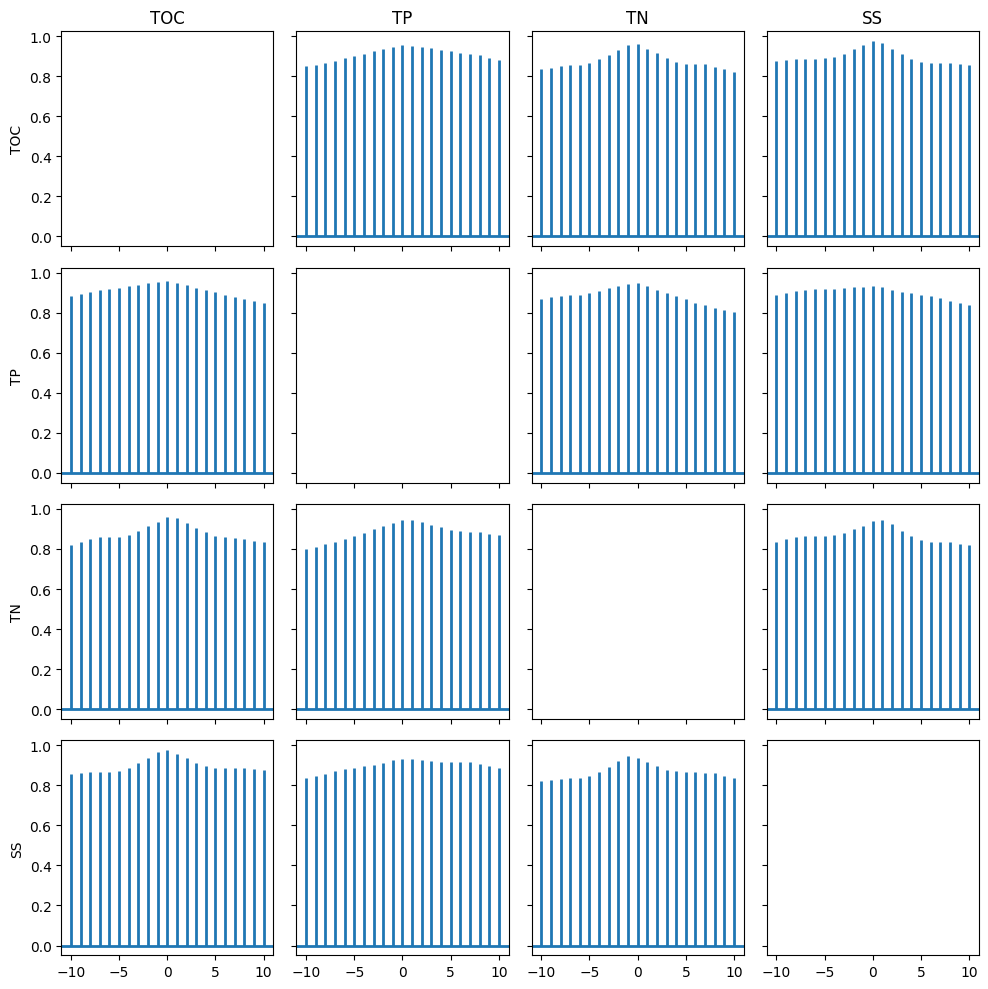

In [111]:
def plot_pollutant_corr(sample_df):
    fig, axes = plt.subplots(4, 4, figsize=(10, 10), sharex=True, sharey=True)

    max_lag = 10

    axes[0][1].xcorr(sample_df["TOC"], sample_df["TN"], usevlines=True, maxlags=max_lag, normed=True, lw=2)
    axes[0][2].xcorr(sample_df["TOC"], sample_df["TP"], usevlines=True, maxlags=max_lag, normed=True, lw=2)
    axes[0][3].xcorr(sample_df["TOC"], sample_df["SS"], usevlines=True, maxlags=max_lag, normed=True, lw=2)
    
    axes[1][0].xcorr(sample_df["TN"], sample_df["TOC"], usevlines=True, maxlags=max_lag, normed=True, lw=2)
    axes[1][2].xcorr(sample_df["TN"], sample_df["TP"], usevlines=True, maxlags=max_lag, normed=True, lw=2)
    axes[1][3].xcorr(sample_df["TN"], sample_df["SS"], usevlines=True, maxlags=max_lag, normed=True, lw=2)
    
    axes[2][0].xcorr(sample_df["TP"], sample_df["TOC"], usevlines=True, maxlags=max_lag, normed=True, lw=2)
    axes[2][1].xcorr(sample_df["TP"], sample_df["TN"], usevlines=True, maxlags=max_lag, normed=True, lw=2)
    axes[2][3].xcorr(sample_df["TP"], sample_df["SS"], usevlines=True, maxlags=max_lag, normed=True, lw=2)

    axes[3][0].xcorr(sample_df["SS"], sample_df["TOC"], usevlines=True, maxlags=max_lag, normed=True, lw=2)
    axes[3][1].xcorr(sample_df["SS"], sample_df["TN"], usevlines=True, maxlags=max_lag, normed=True, lw=2)
    axes[3][2].xcorr(sample_df["SS"], sample_df["TP"], usevlines=True, maxlags=max_lag, normed=True, lw=2)

    axes[0][0].set_ylabel("TOC")
    axes[1][0].set_ylabel("TP")
    axes[2][0].set_ylabel("TN") 
    axes[3][0].set_ylabel("SS")

    axes[0][0].set_title("TOC")
    axes[0][1].set_title("TP")
    axes[0][2].set_title("TN") 
    axes[0][3].set_title("SS")

    plt.tight_layout()
    plt.show()

plot_pollutant_corr(sample_df)


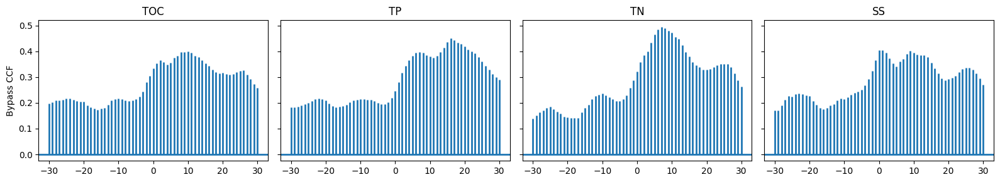

In [119]:
def plot_flow_cc(sample_df):
    fig, axes = plt.subplots(1, 4, figsize=(16, 3), sharex=True, sharey=True)

    max_lag = 30
    flowvar = "Bypass"

    axes[0].xcorr(sample_df[flowvar], sample_df["TOC"], usevlines=True, maxlags=max_lag, normed=True, lw=2)
    axes[1].xcorr(sample_df[flowvar], sample_df["TN"], usevlines=True, maxlags=max_lag, normed=True, lw=2)
    axes[2].xcorr(sample_df[flowvar], sample_df["TP"], usevlines=True, maxlags=max_lag, normed=True, lw=2)
    axes[3].xcorr(sample_df[flowvar], sample_df["SS"], usevlines=True, maxlags=max_lag, normed=True, lw=2)
    
    axes[0].set_ylabel(f"{flowvar} CCF")

    axes[0].set_title("TOC")
    axes[1].set_title("TP")
    axes[2].set_title("TN") 
    axes[3].set_title("SS")

    plt.tight_layout()
    plt.show()

plot_flow_cc(sample_df)